# Домашнее задание №1
## Тестируем алгоритмы бустинга в бою (регрессия).
### Сизиков Константин.

### Скачиваем датасет Marketing-Customer-Value-Analysis для предсказания Customer Livetime Value.

In [1]:
!wget -O WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv https://raw.githubusercontent.com/spendmail/otus_machine_learning_professional_hw/master/hw_01/WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv

--2024-09-12 14:22:53--  https://raw.githubusercontent.com/spendmail/otus_machine_learning_professional_hw/master/hw_01/WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1572784 (1.5M) [text/plain]
Saving to: ‘WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv’

WA_Fn-UseC_-Marketi 100%[===================>]   1.50M   597KB/s    in 2.6s    

2024-09-12 14:22:56 (597 KB/s) - ‘WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv’ saved [1572784/1572784]



### Импортируем необходимые пакеты

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

import warnings

warnings.filterwarnings("ignore")

np.random.seed(123)

### Загружаем данные в pandas dataframe

In [3]:
data = pd.read_csv('WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv')

### Анализируем имеющиеся колонки

In [4]:
data.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,...,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,...,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,...,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,...,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


### Анализируем пропуски данных

In [5]:
data.isnull().sum()

Customer                         0
State                            0
Customer Lifetime Value          0
Response                         0
Coverage                         0
Education                        0
Effective To Date                0
EmploymentStatus                 0
Gender                           0
Income                           0
Location Code                    0
Marital Status                   0
Monthly Premium Auto             0
Months Since Last Claim          0
Months Since Policy Inception    0
Number of Open Complaints        0
Number of Policies               0
Policy Type                      0
Policy                           0
Renew Offer Type                 0
Sales Channel                    0
Total Claim Amount               0
Vehicle Class                    0
Vehicle Size                     0
dtype: int64

### В данном датасете пропусков нет
(В противном случае можно удалить строки или проинициализировать пропуски спец. значениями)

In [6]:
# data = data.dropna()
# data.loc[:, 'Age'] = data.Age.fillna(-999)

### Анализируем уникальные значения колонок

In [7]:
data.nunique()

Customer                         9134
State                               5
Customer Lifetime Value          8041
Response                            2
Coverage                            3
Education                           5
Effective To Date                  59
EmploymentStatus                    5
Gender                              2
Income                           5694
Location Code                       3
Marital Status                      3
Monthly Premium Auto              202
Months Since Last Claim            36
Months Since Policy Inception     100
Number of Open Complaints           6
Number of Policies                  9
Policy Type                         3
Policy                              9
Renew Offer Type                    4
Sales Channel                       4
Total Claim Amount               5106
Vehicle Class                       6
Vehicle Size                        3
dtype: int64

### Если нужно выборочно

In [8]:
data['State'].unique()

array(['Washington', 'Arizona', 'Nevada', 'California', 'Oregon'],
      dtype=object)

### Анализируем типы данных

In [9]:
pd.DataFrame(np.array([data.dtypes, data.iloc[0]]), columns=data.columns)

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,object,object,float64,object,object,object,object,object,object,int64,...,int64,int64,int64,object,object,object,object,float64,object,object
1,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize


### Преобразуем категориальные переменные с помощью LabelEncoder

In [10]:
label_encoder_cols = ['State', 'Response', 'Coverage', 'Education', 'EmploymentStatus', 'Gender', 'Location Code',
                      'Marital Status', 'Policy Type', 'Policy', 'Renew Offer Type', 'Sales Channel', 'Vehicle Class',
                      'Vehicle Size']
le = LabelEncoder()

for col in label_encoder_cols:
    data[col] = le.fit_transform(data[col])

### Удаляем лишние колонки

In [11]:
drop_cols = ['Customer', 'Effective To Date']
data = data.drop(drop_cols, axis=1)

### Предпросмотр результата

In [12]:
data.head()

,State,Customer Lifetime Value,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,4,2763.519279,0,0,0,1,0,56274,1,1,...,5,0,1,0,2,0,0,384.811147,5,1
1,0,6979.535903,0,1,0,4,0,0,1,2,...,42,0,8,1,5,2,0,1131.464935,0,1
2,2,12887.431650,0,2,0,1,0,48767,1,1,...,38,0,2,1,5,0,0,566.472247,5,1
3,1,7645.861827,0,0,0,4,1,0,1,1,...,65,0,7,0,1,0,2,529.881344,3,1
4,4,2813.692575,0,0,0,1,1,43836,0,2,...,44,0,1,1,3,0,0,138.130879,0,1


In [13]:
data.describe()

,State,Customer Lifetime Value,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,...,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,1.741734,8004.940475,0.143201,0.480622,1.554084,1.825706,0.490037,37657.380009,0.979089,1.120210,...,48.064594,0.384388,2.966170,0.825925,3.797788,0.970221,1.102693,434.088794,1.892380,1.089556
std,1.287771,6870.967608,0.350297,0.655817,1.381978,1.347793,0.499928,30379.904734,0.605732,0.636838,...,27.905991,0.910384,2.390182,0.475989,1.605978,1.007576,1.069452,290.500092,2.072992,0.537313
min,0.000000,1898.007675,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.099007,0.000000,0.000000
25%,1.000000,3994.251794,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,24.000000,0.000000,1.000000,1.000000,3.000000,0.000000,0.000000,272.258244,0.000000,1.000000
50%,1.000000,5780.182197,0.000000,0.000000,1.000000,1.000000,0.000000,33889.500000,1.000000,1.000000,...,48.000000,0.000000,2.000000,1.000000,4.000000,1.000000,1.000000,383.945434,0.000000,1.000000
75%,3.000000,8962.167041,0.000000,1.000000,3.000000,4.000000,1.000000,62320.000000,1.000000,2.000000,...,71.000000,0.000000,4.000000,1.000000,5.000000,2.000000,2.000000,547.514839,4.000000,1.000000
max,4.000000,83325.381190,1.000000,2.000000,4.000000,4.000000,1.000000,99981.000000,2.000000,2.000000,...,99.000000,5.000000,9.000000,2.000000,8.000000,3.000000,3.000000,2893.239678,5.000000,2.000000


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   State                          9134 non-null   int64  
 1   Customer Lifetime Value        9134 non-null   float64
 2   Response                       9134 non-null   int64  
 3   Coverage                       9134 non-null   int64  
 4   Education                      9134 non-null   int64  
 5   EmploymentStatus               9134 non-null   int64  
 6   Gender                         9134 non-null   int64  
 7   Income                         9134 non-null   int64  
 8   Location Code                  9134 non-null   int64  
 9   Marital Status                 9134 non-null   int64  
 10  Monthly Premium Auto           9134 non-null   int64  
 11  Months Since Last Claim        9134 non-null   int64  
 12  Months Since Policy Inception  9134 non-null   i

### Строим распределение числовых переменных 

In [15]:
# Целевая колонка
y_column = 'Customer Lifetime Value'

# Колонки параметров
X_columns = data.columns[data.columns != y_column]

X_columns

Index(['State', 'Response', 'Coverage', 'Education', 'EmploymentStatus',
       'Gender', 'Income', 'Location Code', 'Marital Status',
       'Monthly Premium Auto', 'Months Since Last Claim',
       'Months Since Policy Inception', 'Number of Open Complaints',
       'Number of Policies', 'Policy Type', 'Policy', 'Renew Offer Type',
       'Sales Channel', 'Total Claim Amount', 'Vehicle Class', 'Vehicle Size'],
      dtype='object')

### Гистрограмма распределения числовых признаков

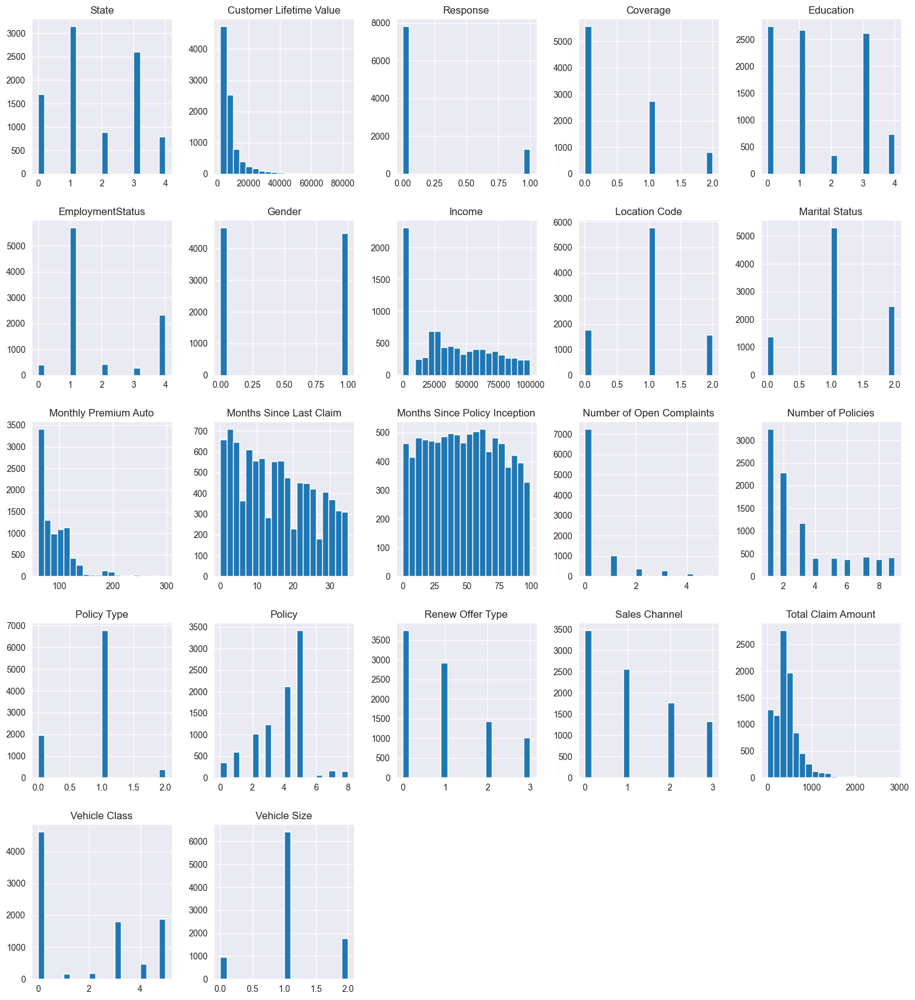

In [16]:
data.hist(figsize=(18, 20), bins=20);

### Карта корреляций

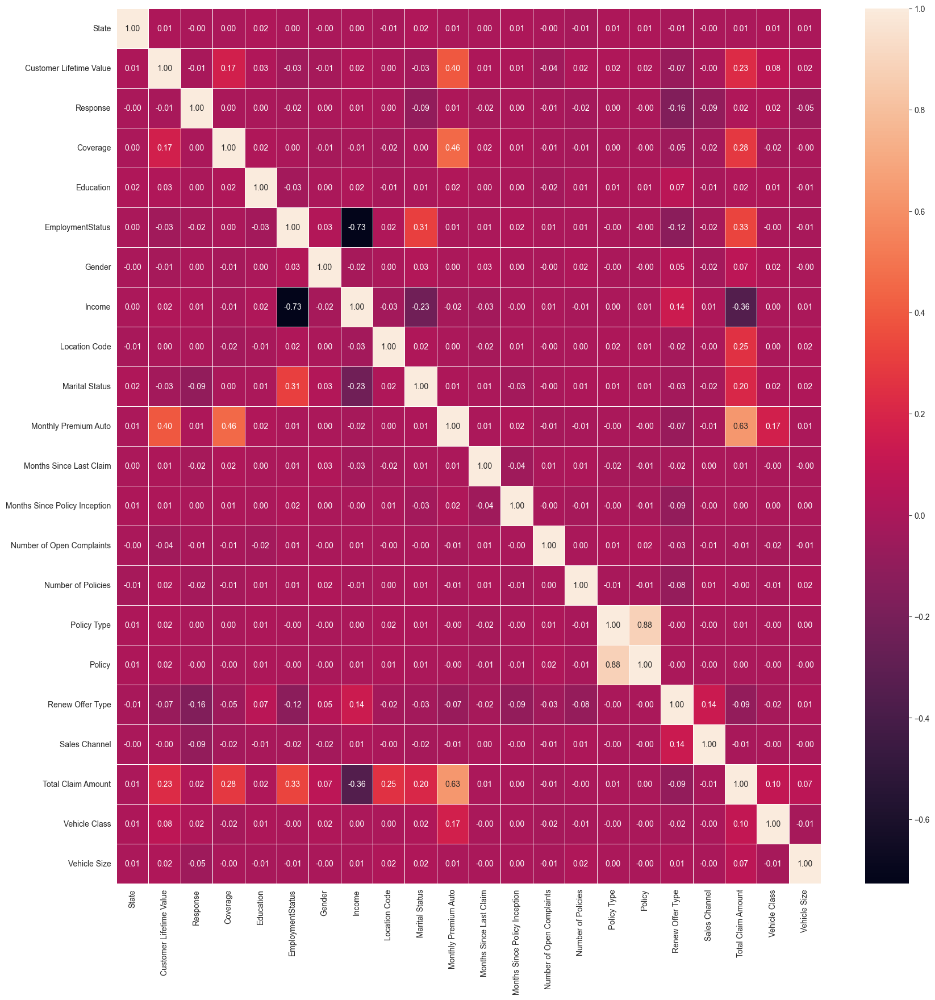

In [17]:
plt.figure(figsize=(20, 20))
sns.heatmap(data.corr(), annot=True, cbar=True, linewidths=.5, fmt='.2f')
plt.show()

### Иногда полезно посмотреть зависимость между двумя параметрами выборочно

In [18]:
# data.plot.scatter(x='gender', y='gender');
# data.plot.scatter(x='MonthlyCharges', y='gender');
# sns.lineplot(y='gender', x='MonthlyCharges', data=data);

### или "все ко всем" 

In [19]:
# %%time
# sns.pairplot(data, height=20);

### Делим наши исходные данные на обучающую (80%) и тестовую (20%) выборки

In [20]:
X = data[X_columns].values
y = data[y_column].values

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=123)

### Нормализуем данные

In [21]:
scaler = StandardScaler()
# scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [22]:
X_train.mean(axis=0)

array([-2.00104519e-16, -4.55955697e-16,  1.87645468e-17,  2.09129735e-16,
        5.91652998e-17, -2.03903011e-17,  2.24232536e-16,  9.43180573e-16,
        5.03877462e-16, -5.95876920e-16, -1.63183184e-17,  5.90133602e-17,
       -3.30970140e-16, -7.82413229e-17, -3.51998588e-16, -3.58425635e-16,
       -8.03702823e-16, -1.25616106e-16,  6.14568536e-15, -6.88620883e-16,
       -2.96646973e-16])

### Реализуем функцию для сбора метрик оценки модели 
### Будем определять все основные метрики: 'MSE', 'MAE', 'RMSE', 'MAPE'   

In [23]:
def rmse(y, y_hat):
    return np.sqrt(mean_squared_error(y_hat, y))

In [24]:
def quality_report(y_test, y_pred, y_train, y_train_pred, model):
    quality_data = pd.DataFrame(
        columns=['Test MSE', 'Test MAE', 'Test RMSE', 'Test MAPE', 'Train MSE', 'Train MAE', 'Train RMSE',
                 'Train MAPE'],
        index=[model])

    # Чем меньше, тем лучше
    # MAE - Средняя абсолютная ошибка
    # MSE - Средняя квадратичная ошибка
    # RMSE - Корень из средней квадратичной ошибки
    # MAPE - Средняя абсолютная ошибка в процентах

    quality_data['Test MSE'] = round(mean_squared_error(y_test, y_pred), 3)
    quality_data['Test MAE'] = round(mean_absolute_error(y_test, y_pred), 3)
    quality_data['Test RMSE'] = round(rmse(y_test, y_pred), 3)
    quality_data['Test MAPE'] = round(mean_absolute_percentage_error(y_test, y_pred), 3)
    quality_data['Train MSE'] = round(mean_squared_error(y_train, y_train_pred), 3)
    quality_data['Train MAE'] = round(mean_absolute_error(y_train, y_train_pred), 3)
    quality_data['Train RMSE'] = round(rmse(y_train, y_train_pred), 3)
    quality_data['Train MAPE'] = round(mean_absolute_percentage_error(y_train, y_train_pred), 3)

    return quality_data

### Для сравнения с градиентным бустингом также реализуем несколько простых моделей

### SKLearn LinearRegression

In [25]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

skllr_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL LR')
skllr_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL LR,3.651209e+07,3785.341,6042.524,0.586,4.016868e+07,3940.815,6337.876,0.6


### SKLearn Ridge

In [26]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=100)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

sklr_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL Ridge')
sklr_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL Ridge,36493052.65,3783.27,6040.948,0.587,4.017212e+07,3939.973,6338.148,0.601


### SKLearn Lasso

In [27]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=100)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

skll_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL Lasso')
skll_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL Lasso,3.655904e+07,3768.07,6046.408,0.593,4.029592e+07,3926.574,6347.907,0.609


### SKLearn ElasticNet

In [28]:
from sklearn.linear_model import ElasticNet

model = ElasticNet(alpha=0.5, l1_ratio=0.5)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

skle_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL ElasticNet')
skle_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL ElasticNet,3.660699e+07,3788.995,6050.371,0.602,4.055922e+07,3958.182,6368.612,0.62


### SKLearn DecisionTreeRegressor

In [29]:
from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor(random_state=0)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

skldt_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL DecisionTree')
skldt_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL DecisionTree,25256225.82,1679.174,5025.557,0.127,0.0,0.0,0.0,0.0


### SKLearn KNeighborsRegressor

In [30]:
from sklearn.neighbors import KNeighborsRegressor

model = KNeighborsRegressor(n_neighbors=1)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

sklknn_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL KNN')
sklknn_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL KNN,6.730879e+07,4453.542,8204.193,0.665,0.0,0.0,0.0,0.0


### SKLearn BaggingRegressor

In [31]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor

model = BaggingRegressor(DecisionTreeRegressor(max_depth=2), warm_start=True)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

sklb_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL Bagging')
sklb_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL Bagging,2.332435e+07,2658.116,4829.529,0.295,2.482836e+07,2690.629,4982.807,0.29


### SKLearn GradientBoostingRegressor

In [32]:
from sklearn.ensemble import GradientBoostingRegressor

# model = GradientBoostingRegressor(max_depth=1, learning_rate=1, warm_start=True)
model = GradientBoostingRegressor(max_depth=2, learning_rate=0.1, warm_start=True)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

sklgb_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL GradientBoosting')
sklgb_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL GradientBoosting,1.428384e+07,1743.059,3779.397,0.157,1.489224e+07,1780.746,3859.047,0.156


### Построим градиетный бустинг на базовых параметрах, используя XGBRegressor

In [33]:
from xgboost import XGBRegressor

model = XGBRegressor()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

xgb_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'XGB')
xgb_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
XGB,1.473519e+07,1881.432,3838.644,0.2,2257809.189,826.039,1502.601,0.102


### Построим градиетный бустинг на базовых параметрах, используя LGBMRegressor

In [34]:
from lightgbm import LGBMRegressor

model = LGBMRegressor()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

lgbm_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'LGBM')
lgbm_report

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 891
[LightGBM] [Info] Number of data points in the train set: 7307, number of used features: 21
[LightGBM] [Info] Start training from score 8016.130952


,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
LGBM,1.371439e+07,1571.468,3703.294,0.13,5610811.18,1088.375,2368.715,0.096


### Построим градиетный бустинг на базовых параметрах, используя CatBoostClassifier

In [35]:
from catboost import CatBoostRegressor

model = CatBoostRegressor()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

cb_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'CatBoost')
cb_report

Learning rate set to 0.05606
0:	learn: 6695.1174472	total: 47.8ms	remaining: 47.7s
1:	learn: 6467.7443750	total: 48.9ms	remaining: 24.4s
2:	learn: 6256.6723163	total: 49.9ms	remaining: 16.6s
3:	learn: 6057.6435585	total: 51ms	remaining: 12.7s
4:	learn: 5869.7182597	total: 52.2ms	remaining: 10.4s
5:	learn: 5712.7543965	total: 53.4ms	remaining: 8.84s
6:	learn: 5552.9766166	total: 54.5ms	remaining: 7.73s
7:	learn: 5406.1472952	total: 55.6ms	remaining: 6.89s
8:	learn: 5269.5037025	total: 56.6ms	remaining: 6.24s
9:	learn: 5146.3433591	total: 57.6ms	remaining: 5.7s
10:	learn: 5030.9398332	total: 58.8ms	remaining: 5.29s
11:	learn: 4925.4995131	total: 59.9ms	remaining: 4.93s
12:	learn: 4828.7781415	total: 60.8ms	remaining: 4.62s
13:	learn: 4740.8056293	total: 62ms	remaining: 4.37s
14:	learn: 4659.3157258	total: 63ms	remaining: 4.13s
15:	learn: 4583.9734890	total: 64.1ms	remaining: 3.94s
16:	learn: 4513.9837387	total: 65.3ms	remaining: 3.77s
17:	learn: 4451.2657746	total: 66.4ms	remaining: 3.62

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
CatBoost,1.328310e+07,1728.072,3644.599,0.164,6108970.616,1247.204,2471.633,0.123


### Сравним результаты по всем моделям:

In [36]:
models_report = pd.concat(
    [skllr_report, sklr_report, skll_report, skle_report, skldt_report, sklknn_report, sklb_report,
     sklgb_report, xgb_report, lgbm_report, cb_report])
models_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL LR,3.651209e+07,3785.341,6042.524,0.586,4.016868e+07,3940.815,6337.876,0.600
SKL Ridge,3.649305e+07,3783.270,6040.948,0.587,4.017212e+07,3939.973,6338.148,0.601
SKL Lasso,3.655904e+07,3768.070,6046.408,0.593,4.029592e+07,3926.574,6347.907,0.609
SKL ElasticNet,3.660699e+07,3788.995,6050.371,0.602,4.055922e+07,3958.182,6368.612,0.620
SKL DecisionTree,2.525623e+07,1679.174,5025.557,0.127,0.000000e+00,0.000,0.000,0.000
SKL KNN,6.730879e+07,4453.542,8204.193,0.665,0.000000e+00,0.000,0.000,0.000
SKL Bagging,2.332435e+07,2658.116,4829.529,0.295,2.482836e+07,2690.629,4982.807,0.290
SKL GradientBoosting,1.428384e+07,1743.059,3779.397,0.157,1.489224e+07,1780.746,3859.047,0.156
XGB,1.473519e+07,1881.432,3838.644,0.200,2.257809e+06,826.039,1502.601,0.102
LGBM,1.371439e+07,1571.468,3703.294,0.130,5.610811e+06,1088.375,2368.715,0.096


### На стандартных параметрах лучший результат показали модели:
- MSE - CatBoost
- MAE - LGBM
- RMSE - CatBoost
- MAPE - SKLearn DecisionTreeRegressor


### Подберем параметры для градиентного бустинга и классических моделей с помощью кросс-валидации и GridSearchCV
(Ориентироваться будем на метрику neg_mean_squared_error)

### SKLearn Ridge

In [37]:
%%time
params = {
    'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0,
              8.0, 9.0,
              10.0, 20, 50, 100, 500, 1000]}
sklr_gs = GridSearchCV(
    Ridge(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
sklr_gs.fit(X_train, y_train)
sklr_gs.best_params_

CPU times: user 1.01 s, sys: 2.78 s, total: 3.79 s
Wall time: 637 ms


{'alpha': 50}

In [48]:
y_pred = sklr_gs.predict(X_test)
y_train_pred = sklr_gs.predict(X_train)

sklr_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL Ridge GS')
sklr_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL Ridge GS,3.650159e+07,3784.214,6041.654,0.586,4.016958e+07,3940.359,6337.948,0.6


### SKLearn Lasso

In [38]:
%%time
params = {
    'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0,
              8.0, 9.0,
              10.0, 20, 50, 100, 500, 1000]}
skll_gs = GridSearchCV(
    Lasso(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
skll_gs.fit(X_train, y_train)
skll_gs.best_params_

CPU times: user 1.84 s, sys: 5.02 s, total: 6.86 s
Wall time: 1.14 s


{'alpha': 50}

In [55]:
y_pred = skll_gs.predict(X_test)
y_train_pred = skll_gs.predict(X_train)

skll_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL Lasso GS')
skll_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL Lasso GS,3.653773e+07,3776.058,6044.645,0.589,4.021269e+07,3932.124,6341.347,0.604


### SKLearn ElasticNet

In [39]:
%%time
params = {
    'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0,
              8.0, 9.0,
              10.0, 20, 50, 100, 500, 1000]}
sklen_gs = GridSearchCV(
    ElasticNet(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
sklen_gs.fit(X_train, y_train)
sklen_gs.best_params_

CPU times: user 1.71 s, sys: 4.78 s, total: 6.48 s
Wall time: 1.06 s


{'alpha': 0.01}

In [56]:
y_pred = sklen_gs.predict(X_test)
y_train_pred = sklen_gs.predict(X_train)

sklen_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL ElasticNet GS')
sklen_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL ElasticNet GS,3.650422e+07,3784.484,6041.872,0.586,4.016917e+07,3940.476,6337.915,0.6


### SKLearn DecisionTreeRegressor

In [40]:
%%time
params = {
    'criterion': ['mse', 'mae', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': list(range(1, 20)),
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': list(range(1, 20)),
}
skldtr_gs = GridSearchCV(
    DecisionTreeRegressor(random_state=0),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
skldtr_gs.fit(X_train, y_train)
skldtr_gs.best_params_

CPU times: user 2min 25s, sys: 205 ms, total: 2min 26s
Wall time: 2min 25s


{'criterion': 'poisson',
 'max_depth': 6,
 'min_samples_leaf': 16,
 'min_samples_split': 2,
 'splitter': 'best'}

In [58]:
y_pred = skldtr_gs.predict(X_test)
y_train_pred = skldtr_gs.predict(X_train)

skldtr_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL ElasticNet GS')
skldtr_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL ElasticNet GS,1.501754e+07,1699.063,3875.247,0.134,1.403872e+07,1643.463,3746.829,0.127


### SKLearn KNeighborsRegressor

In [41]:
%%time
params = {
    'n_neighbors': range(1, 50),
    'weights': ['uniform', 'distance']
}
sklknn_gs = GridSearchCV(
    KNeighborsRegressor(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
sklknn_gs.fit(X_train, y_train)
sklknn_gs.best_params_

CPU times: user 35.2 s, sys: 0 ns, total: 35.2 s
Wall time: 8.82 s


{'n_neighbors': 37, 'weights': 'distance'}

In [51]:
y_pred = sklknn_gs.predict(X_test)
y_train_pred = sklknn_gs.predict(X_train)

sklknn_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL KNN GS')
sklknn_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL KNN GS,3.490712e+07,3643.974,5908.224,0.598,0.0,0.0,0.002,0.0


### SKLearn GradientBoostingRegressor

In [42]:
%%time
params = {'n_estimators': [10, 50, 100, 500],
          'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1.0],
          'subsample': [0.5, 0.7, 1.0],
          'max_depth': [3, 7, 9]
          }
sklgbr_gs = GridSearchCV(
    GradientBoostingRegressor(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
sklgbr_gs.fit(X_train, y_train)
sklgbr_gs.best_params_

CPU times: user 26min 56s, sys: 71.8 ms, total: 26min 56s
Wall time: 26min 56s


{'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 500, 'subsample': 0.7}

In [60]:
y_pred = sklgbr_gs.predict(X_test)
y_train_pred = sklgbr_gs.predict(X_train)

sklgbr_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'SKL GradientBoosting GS')
sklgbr_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL GradientBoosting GS,1.343248e+07,1452.46,3665.035,0.111,2803748.628,716.864,1674.44,0.057


### XGBRegressor

In [43]:
%%time
parameters = {'nthread': [4],
              'objective': ['reg:linear'],
              'learning_rate': [.03, 0.05, .07],  #so called `eta` value
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}
xgbr_gs = GridSearchCV(
    XGBRegressor(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
xgbr_gs.fit(X_train, y_train)
xgbr_gs.best_params_

CPU times: user 19min 39s, sys: 3.69 s, total: 19min 43s
Wall time: 2min 34s


{'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 500, 'subsample': 0.7}

In [52]:
y_pred = xgbr_gs.predict(X_test)
y_train_pred = xgbr_gs.predict(X_train)

xgbr_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'XGB GS')
xgbr_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
XGB GS,13589047.97,1448.118,3686.333,0.109,3379747.179,771.084,1838.409,0.061


### LGBMRegressor

In [44]:
%%time
params = {
    'num_leaves': [7, 14, 21, 28, 31, 50],
    'learning_rate': [0.1, 0.03, 0.003],
    'max_depth': [-1, 3, 5],
    'n_estimators': [50, 100, 200, 500],
}
lgbmr_gs = GridSearchCV(
    LGBMRegressor(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
lgbmr_gs.fit(X_train, y_train)
lgbmr_gs.best_params_

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 885
[LightGBM] [Info] Number of data points in the train set: 5845, number of used features: 21
[LightGBM] [Info] Start training from score 8026.464807
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 885
[LightGBM] [Info] Number of data points in the train set: 5845, number of used features: 21
[LightGBM] [Info] Start training from score 8007.998834
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not eno

{'learning_rate': 0.03, 'max_depth': -1, 'n_estimators': 200, 'num_leaves': 28}

In [53]:
y_pred = lgbmr_gs.predict(X_test)
y_train_pred = lgbmr_gs.predict(X_train)

lgbmr_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'LGBM GS')
lgbmr_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
LGBM GS,1.388208e+07,1556.855,3725.866,0.123,7114942.802,1173.067,2667.385,0.096


### CatBoostRegressor

In [45]:
%%time
params = {'depth': [6, 8, 10],
          'learning_rate': [0.01, 0.05, 0.1],
          'iterations': [30, 50, 100]
          }
cbr_gs = GridSearchCV(
    CatBoostRegressor(),
    params,
    scoring='neg_mean_squared_error',
    cv=5
)
cbr_gs.fit(X_train, y_train)
cbr_gs.best_params_

0:	learn: 6907.2633921	total: 1.45ms	remaining: 42ms
1:	learn: 6863.6602153	total: 2.98ms	remaining: 41.7ms
2:	learn: 6820.8653911	total: 4.26ms	remaining: 38.4ms
3:	learn: 6778.0320116	total: 5.52ms	remaining: 35.9ms
4:	learn: 6735.4991285	total: 6.8ms	remaining: 34ms
5:	learn: 6696.8015106	total: 8.13ms	remaining: 32.5ms
6:	learn: 6655.4701876	total: 9.5ms	remaining: 31.2ms
7:	learn: 6615.2067994	total: 10.9ms	remaining: 30ms
8:	learn: 6574.9753988	total: 12.3ms	remaining: 28.8ms
9:	learn: 6535.3510027	total: 13.7ms	remaining: 27.5ms
10:	learn: 6496.2061773	total: 15.1ms	remaining: 26.1ms
11:	learn: 6457.0569229	total: 16.5ms	remaining: 24.7ms
12:	learn: 6418.3064896	total: 17.7ms	remaining: 23.2ms
13:	learn: 6380.3352404	total: 19.2ms	remaining: 21.9ms
14:	learn: 6343.4775827	total: 20.9ms	remaining: 20.9ms
15:	learn: 6308.3867185	total: 22.4ms	remaining: 19.6ms
16:	learn: 6272.9073254	total: 23.7ms	remaining: 18.1ms
17:	learn: 6236.7599142	total: 24.9ms	remaining: 16.6ms
18:	learn:

{'depth': 10, 'iterations': 100, 'learning_rate': 0.1}

In [54]:
y_pred = cbr_gs.predict(X_test)
y_train_pred = cbr_gs.predict(X_train)

cbr_gs_report = quality_report(y_test, y_pred, y_train, y_train_pred, 'CatBoost GS')
cbr_gs_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
CatBoost GS,1.295260e+07,1632.511,3598.972,0.143,6508875.027,1197.76,2551.25,0.108


### Сравнение результатов по всем моделям с использованием GridSearchCV и без

In [61]:
models_report = pd.concat(
    [skllr_report, sklr_report, sklr_gs_report, skll_report, skll_gs_report, skle_report, sklen_gs_report, skldt_report,
     skldtr_gs_report, sklknn_report, sklknn_gs_report, sklb_report,
     sklgb_report, sklgbr_gs_report, xgb_report, xgbr_gs_report, lgbm_report, lgbmr_gs_report, cb_report,
     cbr_gs_report])
models_report

,Test MSE,Test MAE,Test RMSE,Test MAPE,Train MSE,Train MAE,Train RMSE,Train MAPE
SKL LR,3.651209e+07,3785.341,6042.524,0.586,4.016868e+07,3940.815,6337.876,0.600
SKL Ridge,3.649305e+07,3783.270,6040.948,0.587,4.017212e+07,3939.973,6338.148,0.601
SKL Ridge GS,3.650159e+07,3784.214,6041.654,0.586,4.016958e+07,3940.359,6337.948,0.600
SKL Lasso,3.655904e+07,3768.070,6046.408,0.593,4.029592e+07,3926.574,6347.907,0.609
SKL Lasso GS,3.653773e+07,3776.058,6044.645,0.589,4.021269e+07,3932.124,6341.347,0.604
SKL ElasticNet,3.660699e+07,3788.995,6050.371,0.602,4.055922e+07,3958.182,6368.612,0.620
SKL ElasticNet GS,3.650422e+07,3784.484,6041.872,0.586,4.016917e+07,3940.476,6337.915,0.600
SKL DecisionTree,2.525623e+07,1679.174,5025.557,0.127,0.000000e+00,0.000,0.000,0.000
SKL ElasticNet GS,1.501754e+07,1699.063,3875.247,0.134,1.403872e+07,1643.463,3746.829,0.127
SKL KNN,6.730879e+07,4453.542,8204.193,0.665,0.000000e+00,0.000,0.000,0.000


### Итоговый результат лучше всего показали модели:
- MSE - CatBoost (GridSearch)
- MAE - XGB (GridSearch)
- RMSE - CatBoost (GridSearch)
- MAPE - XGB (GridSearch)
